In [26]:
from typing import Literal
import torchvision
import matplotlib.pyplot as plt
import numpy as np
from torchvision.transforms import v2 as transforms
from torchvision.utils import make_grid
import torch

In [10]:
# Get Food101 dataset
train_data = torchvision.datasets.Food101(root="data", split="train", download=True)
test_data = torchvision.datasets.Food101(root="data", split="test", download=True)

print(f"Number of training samples: {len(train_data):,}")
print(f"Number of testing samples: {len(test_data):,}")

Number of training samples: 75,750
Number of testing samples: 25,250


In [11]:
# Get class names
class_names = train_data.classes
class_names[:10]

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito']

In [ ]:
def visualize_samples(dataset, class_names, num_samples=25):
    plt.figure(figsize=(10, 10))

    n_cols = int(num_samples**0.5)
    n_rows = (num_samples + n_cols - 1) // n_cols

    indices = np.random.choice(len(dataset), num_samples, replace=False)

    for i, idx in enumerate(indices):
        image, label = dataset[idx]
        plt.subplot(n_rows, n_cols, i + 1)
        plt.imshow(image)
        plt.title(class_names[label])
        plt.axis("off")

    plt.tight_layout()
    plt.show()

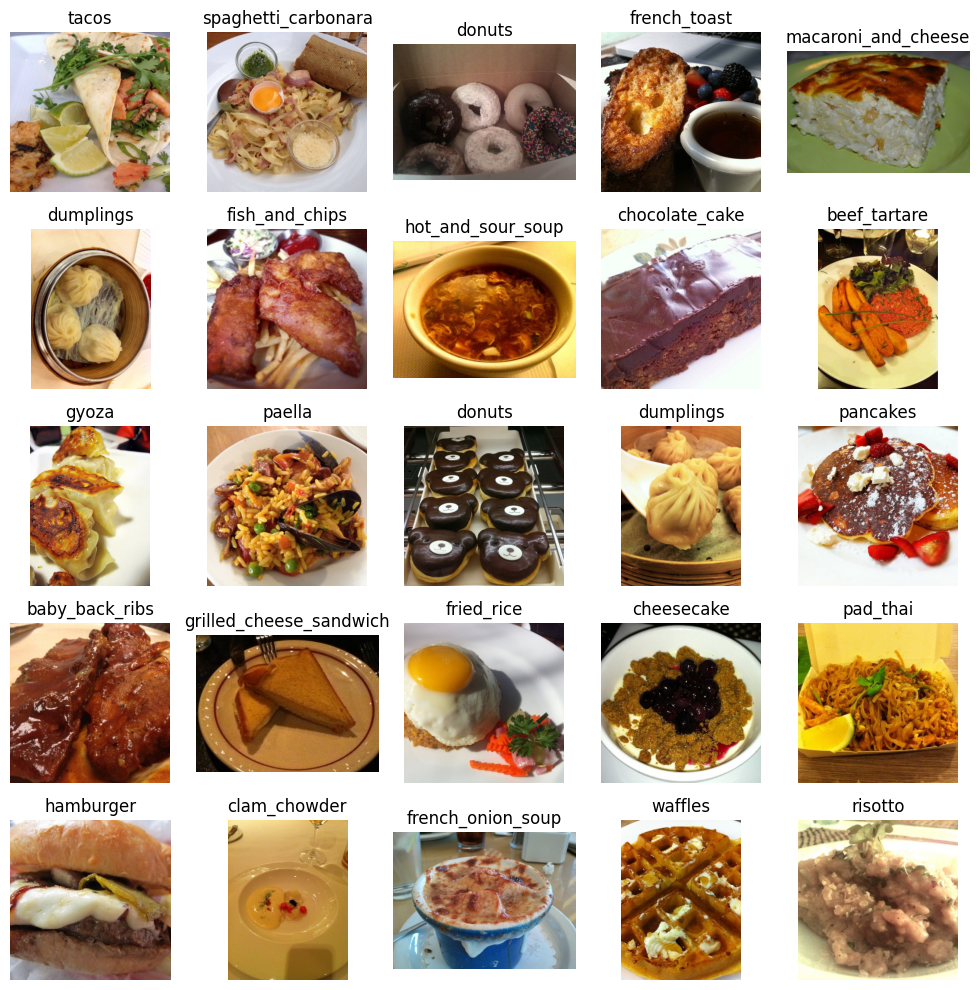

In [13]:
visualize_samples(train_data, class_names)

In [16]:
for i in range(25):
    random_idx = np.random.randint(0, len(train_data))
    image, label = train_data[random_idx]
    print(f"Image shape: {image.size}, Label: {class_names[label]}")

Image shape: (512, 512), Label: hot_and_sour_soup
Image shape: (512, 512), Label: foie_gras
Image shape: (512, 384), Label: poutine
Image shape: (512, 306), Label: risotto
Image shape: (512, 382), Label: sashimi
Image shape: (512, 512), Label: sushi
Image shape: (512, 375), Label: sushi
Image shape: (382, 512), Label: ice_cream
Image shape: (512, 382), Label: pulled_pork_sandwich
Image shape: (512, 383), Label: eggs_benedict
Image shape: (384, 512), Label: ice_cream
Image shape: (512, 512), Label: tacos
Image shape: (512, 384), Label: panna_cotta
Image shape: (512, 512), Label: seaweed_salad
Image shape: (512, 512), Label: fried_calamari
Image shape: (512, 512), Label: pulled_pork_sandwich
Image shape: (512, 512), Label: lobster_roll_sandwich
Image shape: (512, 512), Label: falafel
Image shape: (512, 512), Label: edamame
Image shape: (512, 289), Label: spring_rolls
Image shape: (512, 384), Label: pad_thai
Image shape: (512, 512), Label: chocolate_cake
Image shape: (512, 512), Label: ta

In [38]:
def to_numpy(img) -> np.ndarray:
    if isinstance(img, torch.Tensor):
        return img.detach().cpu().permute(1, 2, 0).numpy()
    return np.array(img)


def visualize_transforms(
    dataset: torch.utils.data.Dataset,
    class_names: list[str],
    transform: transforms.Compose,
    title: str,
    num_samples: int = 5,
    show_steps: bool = False,
):
    transform_list = (
        transform.transforms if hasattr(transform, "transforms") else [transform]
    )

    # +2 when showing steps → original + steps + final
    n_cols = 2 if not show_steps else (len(transform_list) + 2)

    fig, axes = plt.subplots(num_samples, n_cols, figsize=(4 * n_cols, 4 * num_samples))
    axes = np.atleast_2d(axes)

    for i in range(num_samples):
        img, label = dataset[np.random.randint(len(dataset))]

        # --- Original ---
        axes[i, 0].imshow(to_numpy(img))
        axes[i, 0].set_title(f"Original: {class_names[label]}")
        axes[i, 0].axis("off")

        if show_steps:
            current = img

            # --- Step-by-step ---
            for j, t in enumerate(transform_list, start=1):
                current = t(current)
                axes[i, j].imshow(to_numpy(current))
                axes[i, j].set_title(t.__class__.__name__)
                axes[i, j].axis("off")

            # --- Final composed ---
            final_img = transform(img)
            axes[i, -1].imshow(to_numpy(final_img))
            axes[i, -1].set_title("Final")
            axes[i, -1].axis("off")

        else:
            transformed = transform(img)
            axes[i, 1].imshow(to_numpy(transformed))
            axes[i, 1].set_title("Transformed")
            axes[i, 1].axis("off")

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

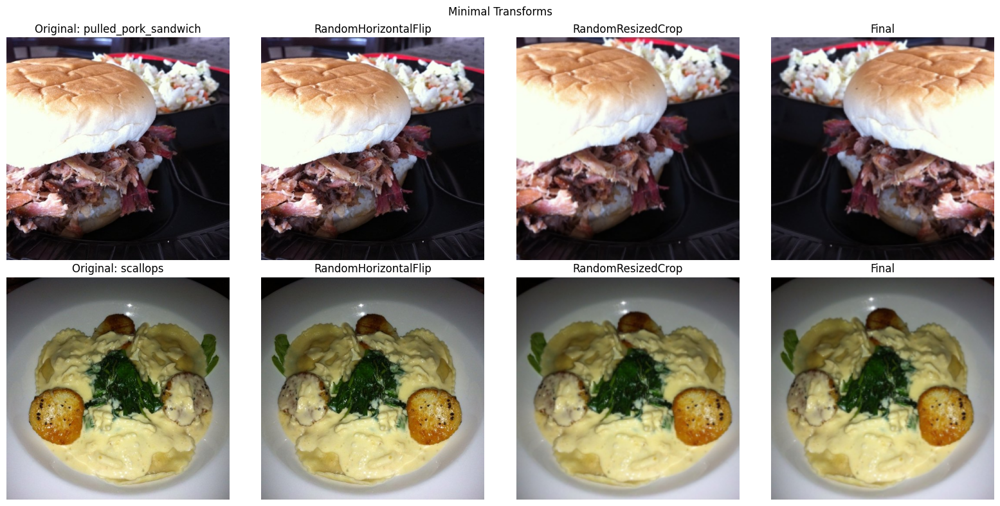

In [39]:
minimal_transforms = transforms.Compose(
    [
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomResizedCrop(size=(224, 224), scale=(0.9, 1.0)),
    ]
)

visualize_transforms(
    train_data,
    class_names,
    minimal_transforms,
    title="Minimal Transforms",
    num_samples=2,
    show_steps=True,
)

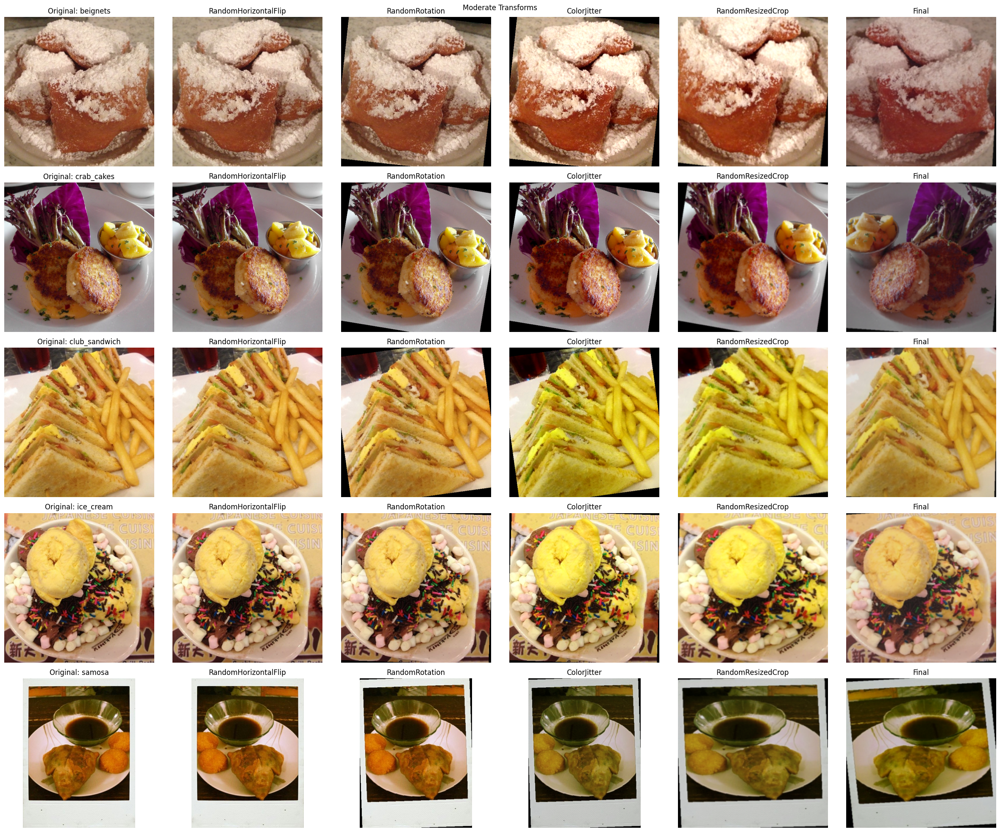

In [40]:
moderate_transforms = transforms.Compose(
    [
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomRotation(degrees=10),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.05),
        transforms.RandomResizedCrop(size=(224, 224), scale=(0.8, 1.0)),
    ]
)

visualize_transforms(
    train_data,
    class_names,
    moderate_transforms,
    title="Moderate Transforms",
    num_samples=5,
    show_steps=True,
)

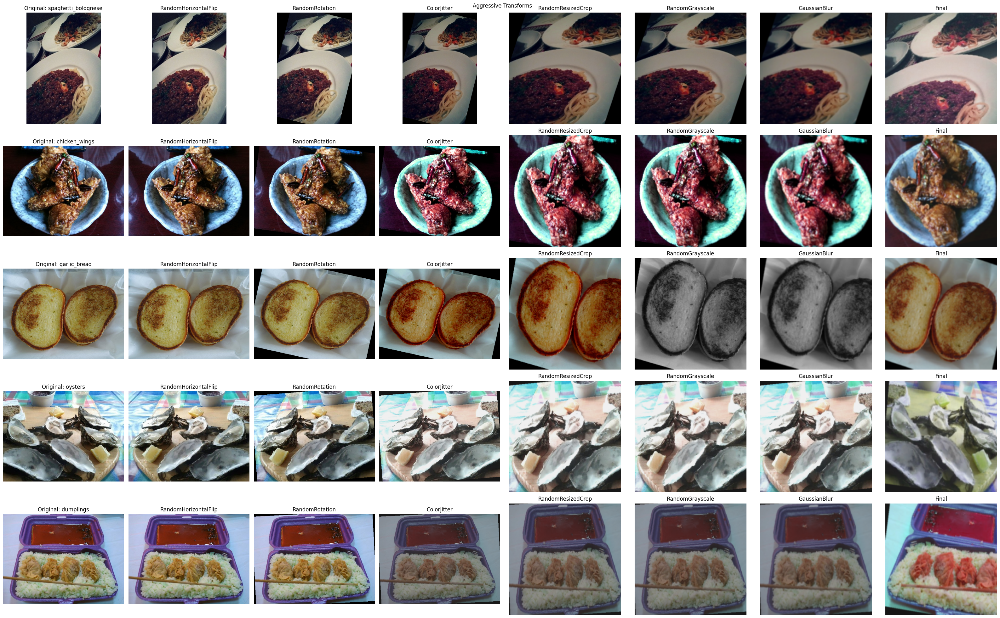

In [46]:
aggressive_transforms = transforms.Compose(
    [
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomRotation(degrees=15),
        transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
        transforms.RandomResizedCrop(size=(224, 224), scale=(0.7, 1.0)),
        transforms.RandomGrayscale(p=0.05),
        transforms.GaussianBlur(kernel_size=3, sigma=(0.1, 2.0)),
    ]
)

visualize_transforms(
    train_data,
    class_names,
    aggressive_transforms,
    title="Aggressive Transforms",
    num_samples=5,
    show_steps=True,
)